In [1]:
import matplotlib.pyplot as plt 
import seaborn as sns
import numpy as np 
import os 
import cv2
import pickle
import pandas as pd
import itertools
import tensorflow as tf
from tensorflow.keras.models import load_model
from sklearn.metrics import confusion_matrix

%matplotlib inline


In [2]:
cm_plot_labels = ['Heart','Oblong','Oval','Round', 'Square']
fig_path = 'C:/Users/whisn/FaceShape Dataset/image/'

def create_confusion_matrix(y_test_labels, y_preds, classes, title='Confusion Matrix', 
                            normalize=False, cmap=plt.cm.Blues):

    cm = confusion_matrix(y_test_labels, y_preds)
    
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    # print(cm)

    plt.figure(figsize=(16,8))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize = 15)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.savefig(f"{fig_path+title}.png");    # for saving images to .png file
    plt.show()

In [3]:
y_label_dict = {0: 'Heart', 1: 'Oblong', 2: 'Oval', 3: 'Round', 4: 'Square'}

def show_X_img(num, index_array, X_array, y_actual, fig_title, ncols=1):
    '''this function display images from an image array'''
    ncols= ncols
    nrows= int(num/ncols)
    fig, ax = plt.subplots(nrows, ncols, figsize =(ncols*4,nrows*4))
    fig.suptitle(fig_title, size = 20)
    ax = ax.ravel()
    for i, index in enumerate(index_array):
        img = X_array[index] * 255
        img = np.asarray(img, int)
        label = y_label_dict[y_actual[index]]
        ax[i].imshow(img, cmap='gray')
        ax[i].set_title(label, size=16)




In [4]:
def compare_misclass(df, predict, fig_title='Comparing Misclassification', ax_title=''):
    fig, ax = plt.subplots(nrows=1, ncols=2, sharey=True, figsize=(15,5))
    fig.suptitle(fig_title, fontsize=16)
    ax[0].hist(df.y_actual, bins=9, color='lightcoral')
    ax[0].set_xticks(range(0,5))
    ax[0].set_xticklabels(cm_plot_labels)
    ax[0].set_title(f'{ax_title}\n ACTUAL CLASS')
    ax[1].hist(df[predict], bins=9, color='mediumturquoise')
    ax[1].set_xticks(range(0,5))
    ax[1].set_xticklabels(cm_plot_labels)
    ax[1].set_title(f'{ax_title}\n PREDICTED CLASS');
    plt.savefig(f"{fig_path+fig_title}.png");

In [5]:
def plot_misclass_img_proba(df, list_index):
  for i in list_index:
    img = X_test[i] * 255
    img = np.asarray(img, int)
    label = y_label_dict[y_actual[i]]

    plt.figure(figsize=(15,5))
    plt.subplot(1,3,1)
    plt.imshow(img, cmap='gray')
    plt.title(label, size=16)
    plt.subplot(1,3,2)
    df.loc[i, ['heart_s', 'oblong_s', 'oval_s', 'round_s','square_s']].plot(kind='bar', color='pink')
    plt.title('Probabilities - CNN from scratch', fontsize=14, y=1.01)
    plt.subplot(1,3,3)
    df.loc[i, ['heart_t', 'oblong_t', 'oval_t', 'round_t','square_t']].plot(kind='bar', color='plum')
    plt.title('Probabilities - CNN transfer learning', fontsize=14, y=1.01);

In [6]:
path = "C:/Users/whisn/FaceShape Dataset/data/"

# Pastikan path dan nama file digabung dengan benar
X_train = np.asarray(pickle.load(open(path + "X_train_rgb.pickle", "rb")))
y_train = np.asarray(pickle.load(open(path + "y_train_rgb.pickle", "rb")))
X_test = np.asarray(pickle.load(open(path + "X_test_rgb.pickle", "rb")))
y_test = np.asarray(pickle.load(open(path + "y_test_rgb.pickle", "rb")))

In [7]:
print("Data Summary")
print("--------------------")
print(f"X_train shape {X_train.shape}")
print(f"y_train shape {y_train.shape}")
print("--------------------")
print(f"X_test shape {X_test.shape}")
print(f"y_test shape {y_test.shape}")

Data Summary
--------------------
X_train shape (3999, 224, 224, 3)
y_train shape (3999, 5)
--------------------
X_test shape (1000, 224, 224, 3)
y_test shape (1000, 5)


In [8]:
# New model from scratch

scratch_path = 'C:/Users/whisn/FaceShape Dataset/saved_models/extra/'
scratch_file = scratch_path + 'agmt_oct12.keras'
mod_scratch = tf.keras.models.load_model(scratch_file)



In [10]:
# Transfer Learning model from VGG-Face

transfer_path = 'C:/Users/whisn/FaceShape Dataset/saved_models/'
transfer_file = transfer_path + 'vgg16-face-2.keras'
mod_transfer = tf.keras.models.load_model(transfer_file)

C:\Users\whisn\New folder\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 6 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [11]:
# Make predictions
y_actual = np.argmax(y_test, axis=-1)
y_predict_scratch = np.argmax(mod_scratch.predict(X_test), axis=1)
y_predict_transfer = np.argmax(mod_transfer.predict(X_test), axis=1)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 302s 9s/step


In [12]:
mod_scratch.evaluate(X_test, y_test)

32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - accuracy: 0.4486 - loss: 1.3514


[1.3654985427856445, 0.4339999854564667]

In [13]:
mod_transfer.evaluate(X_test, y_test)

32/32 ━━━━━━━━━━━━━━━━━━━━ 289s 9s/step - accuracy: 0.8516 - loss: 0.4401


[0.46197834610939026, 0.8399999737739563]

Normalized confusion matrix


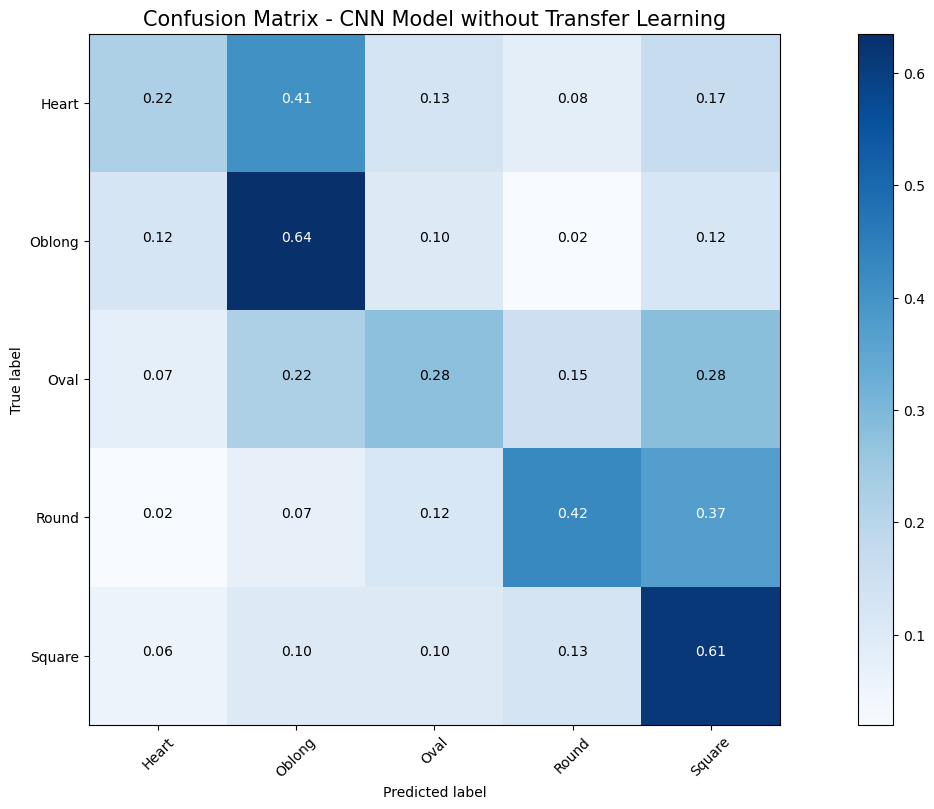

In [14]:
create_confusion_matrix(y_actual, y_predict_scratch, cm_plot_labels, 
                        title='Confusion Matrix - CNN Model without Transfer Learning', 
                        normalize=True, cmap=plt.cm.Blues)

Normalized confusion matrix


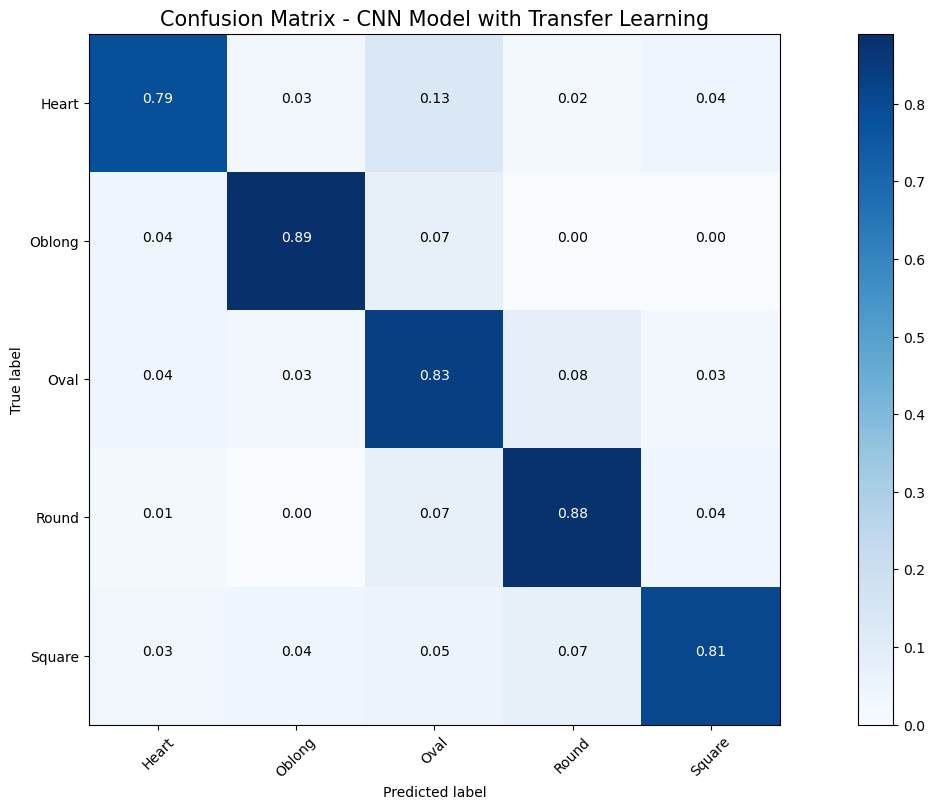

In [15]:
create_confusion_matrix(y_actual, y_predict_transfer, cm_plot_labels, 
                        title='Confusion Matrix - CNN Model with Transfer Learning', 
                        normalize=True, cmap=plt.cm.Blues)

In [19]:
def create_df(y_actual, y_predict, predict_proba, X_test, y_test):
  '''this function creates a dataframe with predictions and probabilities of a model'''
  # generate predictions

  actual = pd.DataFrame(y_actual, columns=['y_actual'])
  predict = pd.DataFrame(y_predict, columns=['y_predict'])

  # generate prediction probabilities 

  probability_list = []
  for i, item in enumerate(predict_proba):
    probabilities = {}
    probabilities['heart'] = round(item[0] * 100,2)
    probabilities['oblong'] = round(item[1] * 100,2)
    probabilities['oval'] = round(item[2] *100,2)
    probabilities['round'] = round(item[3] *100,2)
    probabilities['square'] = round(item[4] *100,2)
    probability_list.append(probabilities)
  proba = pd.DataFrame(probability_list)

  # create dataframe
  df = pd.concat([actual, predict, proba],axis=1)
  
  return df


In [21]:
# Probabilitas prediksi untuk model scratch
predict_proba_scratch = mod_scratch.predict(X_test)
y_predict_scratch = np.argmax(predict_proba_scratch, axis=1)

# Probabilitas prediksi untuk model transfer
predict_proba_transfer = mod_transfer.predict(X_test)
y_predict_transfer = np.argmax(predict_proba_transfer, axis=1)

# Label aktual
y_actual = np.argmax(y_test, axis=1)  # Asumsi y_test dalam one-hot encoding

# Buat DataFrame
scratch = create_df(y_actual, y_predict_scratch, predict_proba_scratch, X_test, y_test)
transfer = create_df(y_actual, y_predict_transfer, predict_proba_transfer, X_test, y_test)

print(scratch.head())
print(transfer.head())


32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 275s 9s/step
   y_actual  y_predict  heart  oblong   oval  round  square
0         2          2  30.06   22.90  30.56  12.84    3.64
1         1          4  20.65   20.26  21.70  14.76   22.64
2         0          4  20.65   20.26  21.70  14.76   22.64
3         4          1  28.88   35.43  23.44   4.69    7.56
4         3          4  16.21   11.98  21.79  18.36   31.66
   y_actual  y_predict  heart  oblong   oval  round  square
0         2          2   0.04    0.17  99.58   0.21    0.01
1         1          1   0.00   99.42   0.00   0.56    0.02
2         0          0  56.58    0.19   0.48   0.12   42.64
3         4          3   1.34    2.00  20.09  72.57    4.01
4         3          2   0.17    0.05  47.22  40.10   12.45


In [22]:
# dataframe for model built from scratch
scratch.columns = [x + '_s' for x in scratch.columns]
scratch.head()

,y_actual_s,y_predict_s,heart_s,oblong_s,oval_s,round_s,square_s
0,2,2,30.06,22.90,30.56,12.84,3.64
1,1,4,20.65,20.26,21.70,14.76,22.64
2,0,4,20.65,20.26,21.70,14.76,22.64
3,4,1,28.88,35.43,23.44,4.69,7.56
4,3,4,16.21,11.98,21.79,18.36,31.66


In [23]:
# dataframe for model with transfer learning
transfer.columns = [x + '_t' for x in transfer.columns]
transfer.head()

,y_actual_t,y_predict_t,heart_t,oblong_t,oval_t,round_t,square_t
0,2,2,0.04,0.17,99.58,0.21,0.01
1,1,1,0.00,99.42,0.00,0.56,0.02
2,0,0,56.58,0.19,0.48,0.12,42.64
3,4,3,1.34,2.00,20.09,72.57,4.01
4,3,2,0.17,0.05,47.22,40.10,12.45


In [24]:
# combine the data frame for evaluations
evaluations = pd.concat([scratch, transfer], axis=1)

# drop one of the y_actual as they are the same
evaluations = evaluations.drop(columns='y_actual_t')
evaluations = evaluations.rename(columns={'y_actual_s': 'y_actual'})

# create columns with actual labels
evaluations['actual'] = evaluations['y_actual'].map(y_label_dict)
evaluations['s_predict'] = evaluations['y_predict_s'].map(y_label_dict)
evaluations['t_predict'] = evaluations['y_predict_t'].map(y_label_dict)

# create new columns to detect where the 2 models misclassify, and the differences in predictions
evaluations['predict_diff'] = evaluations['y_predict_s'] - evaluations['y_predict_t']
evaluations['t_misclass'] = evaluations['y_actual'] - evaluations['y_predict_t']
evaluations['s_misclass'] = evaluations['y_actual'] - evaluations['y_predict_s']

evaluations

,y_actual,y_predict_s,heart_s,oblong_s,oval_s,round_s,square_s,y_predict_t,heart_t,oblong_t,oval_t,round_t,square_t,actual,s_predict,t_predict,predict_diff,t_misclass,s_misclass
0,2,2,30.06,22.90,30.56,12.84,3.64,2,0.04,0.17,99.58,0.21,0.01,Oval,Oval,Oval,0,0,0
1,1,4,20.65,20.26,21.70,14.76,22.64,1,0.00,99.42,0.00,0.56,0.02,Oblong,Square,Oblong,3,0,-3
2,0,4,20.65,20.26,21.70,14.76,22.64,0,56.58,0.19,0.48,0.12,42.64,Heart,Square,Heart,4,0,-4
3,4,1,28.88,35.43,23.44,4.69,7.56,3,1.34,2.00,20.09,72.57,4.01,Square,Oblong,Round,-2,1,3
4,3,4,16.21,11.98,21.79,18.36,31.66,2,0.17,0.05,47.22,40.10,12.45,Round,Square,Oval,2,1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,2,2,21.43,19.00,23.34,17.47,18.76,2,1.99,3.23,84.50,0.80,9.48,Oval,Oval,Oval,0,0,0
996,3,4,16.86,11.71,23.08,20.65,27.70,3,10.61,5.34,11.22,70.95,1.88,Round,Square,Round,1,0,-1
997,2,2,21.95,17.51,24.81,20.53,15.20,0,57.24,0.19,35.61,5.24,1.71,Oval,Oval,Heart,2,2,0
998,1,1,28.25,30.73,24.36,6.28,10.37,1,0.94,92.53,6.13,0.21,0.19,Oblong,Oblong,Oblong,0,0,0


In [25]:
print('SUMMARY OF MISCLASSIFICATION')

correct = evaluations[(evaluations.y_predict_t == evaluations.y_actual) & (evaluations.y_predict_s == evaluations.y_actual)]
print(f'\nNumber of images that both models predicted correctly are {correct.shape[0]}')

misclass = evaluations[(evaluations.y_predict_t != evaluations.y_actual) | (evaluations.y_predict_s != evaluations.y_actual)]
print(f'Number of images that are misclassified by either of the models are {misclass.shape[0]}')
print(f'\n--------------------------------------------------------------------------------------\n')

# where both models predicted incorrectly
both_wrong = misclass[(misclass.s_misclass != 0) & (misclass.t_misclass != 0)]
both_wrong_same = misclass[((misclass.s_misclass != 0) & (misclass.t_misclass != 0)) & (misclass.t_misclass == misclass.s_misclass)]
both_wrong_different = misclass[((misclass.s_misclass != 0) & (misclass.t_misclass != 0)) & (misclass.t_misclass != misclass.s_misclass)]
print(f"Both models predicted incorrectly: {both_wrong.shape[0]}")
print(f"Same class: {both_wrong_same.shape[0]}")
print(f"Different class: {both_wrong_different.shape[0]}")
print(f'\n--------------------------------------------------------------------------------------\n')

# where transfer learning improved predictions vs. the model from scratch
t_misclass = misclass[(misclass.t_misclass != 0)]
print(f"Transfer learning predicted incorrectly: {misclass[(misclass.t_misclass != 0)].shape[0]}")
print(f"Model from scratch predicted correctly: {misclass[(misclass.t_misclass != 0) & (misclass.s_misclass == 0)].shape[0]}")
print(f'\n--------------------------------------------------------------------------------------\n')

# where model from scratch predicted correctly, but the transfer learning did not
s_misclass = misclass[(misclass.s_misclass != 0)]
print(f"Transfer learning predicted incorrectly: {misclass[(misclass.s_misclass != 0)].shape[0]}")
print(f"Model from scratch predicted correctly: {misclass[(misclass.s_misclass != 0) & (misclass.t_misclass == 0)].shape[0]}")
print(f'\n--------------------------------------------------------------------------------------\n')


SUMMARY OF MISCLASSIFICATION

Number of images that both models predicted correctly are 393
Number of images that are misclassified by either of the models are 607

--------------------------------------------------------------------------------------

Both models predicted incorrectly: 119
Same class: 44
Different class: 75

--------------------------------------------------------------------------------------

Transfer learning predicted incorrectly: 160
Model from scratch predicted correctly: 41

--------------------------------------------------------------------------------------

Transfer learning predicted incorrectly: 566
Model from scratch predicted correctly: 447

--------------------------------------------------------------------------------------



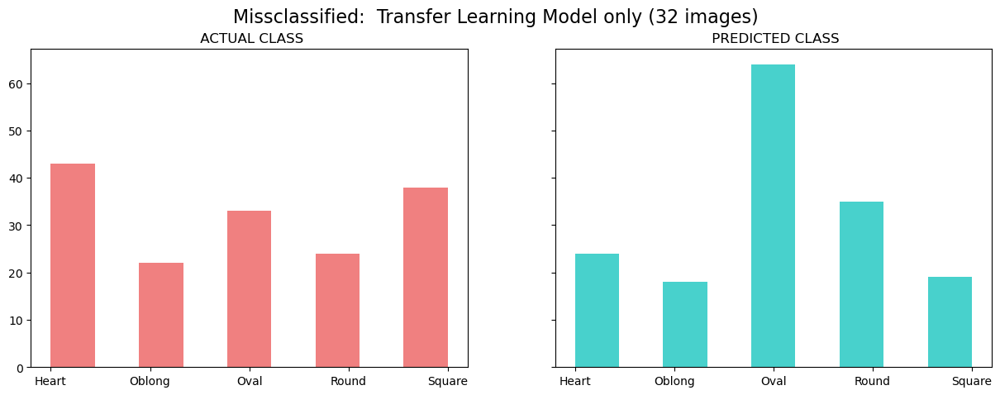

In [26]:
compare_misclass(t_misclass, 'y_predict_t', fig_title='Missclassified:  Transfer Learning Model only (32 images)', ax_title='')

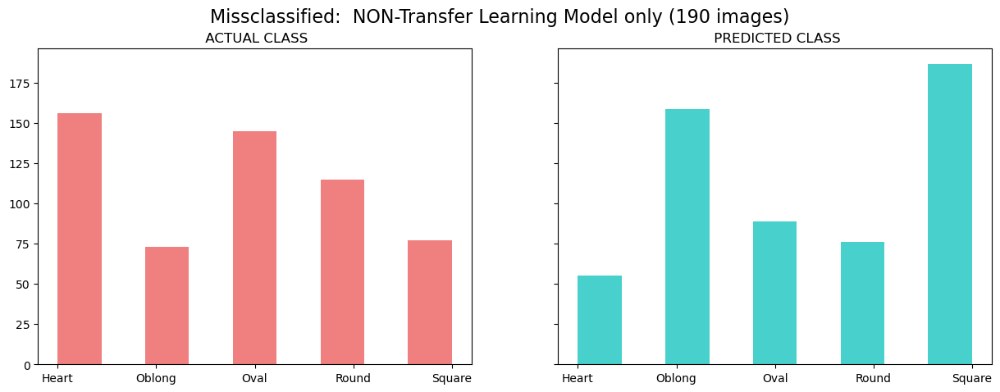

In [27]:
compare_misclass(s_misclass, 'y_predict_s', fig_title='Missclassified:  NON-Transfer Learning Model only (190 images)', ax_title='')

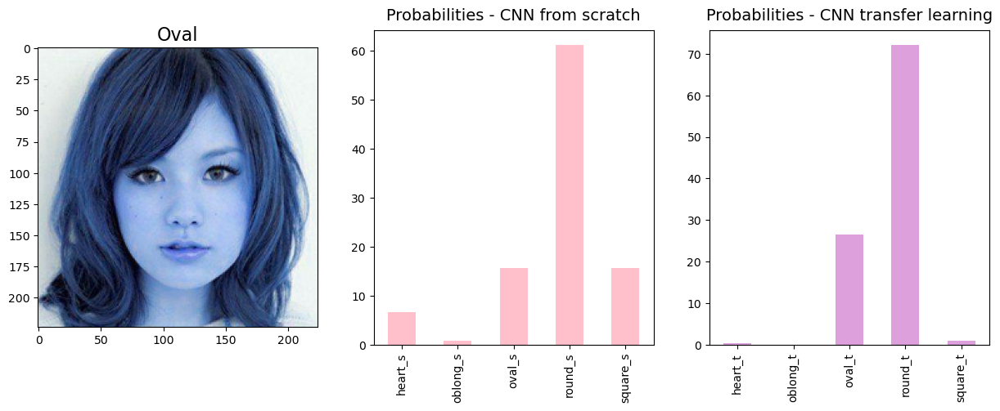

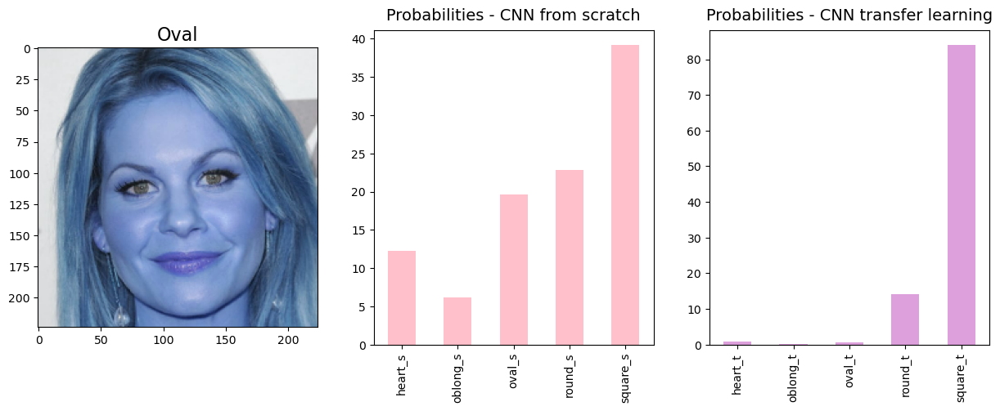

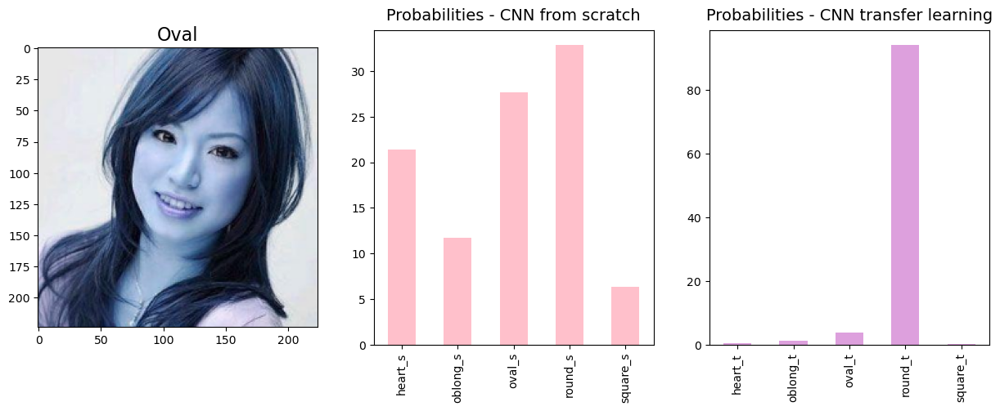

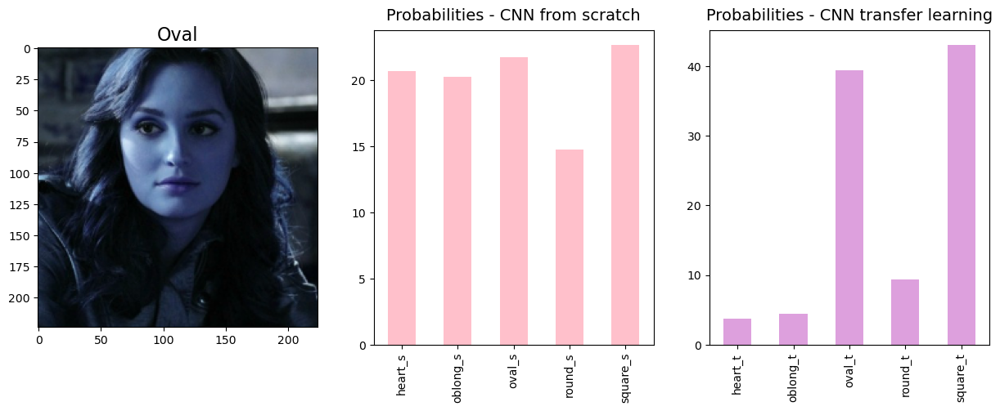

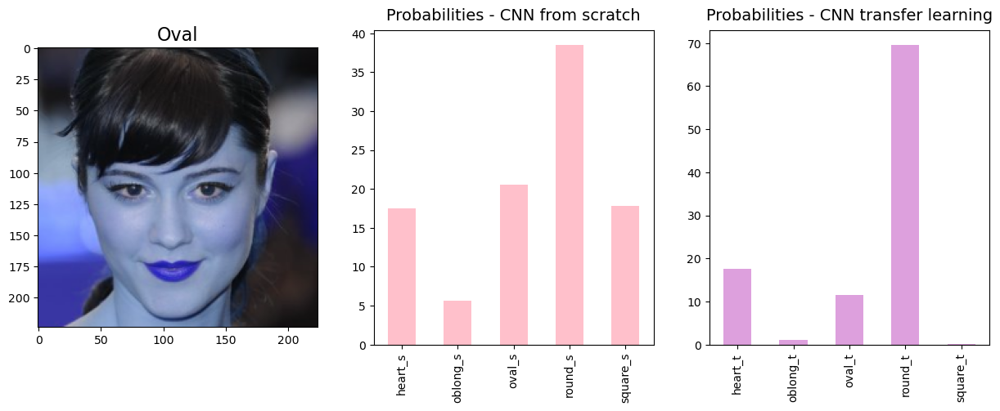

...

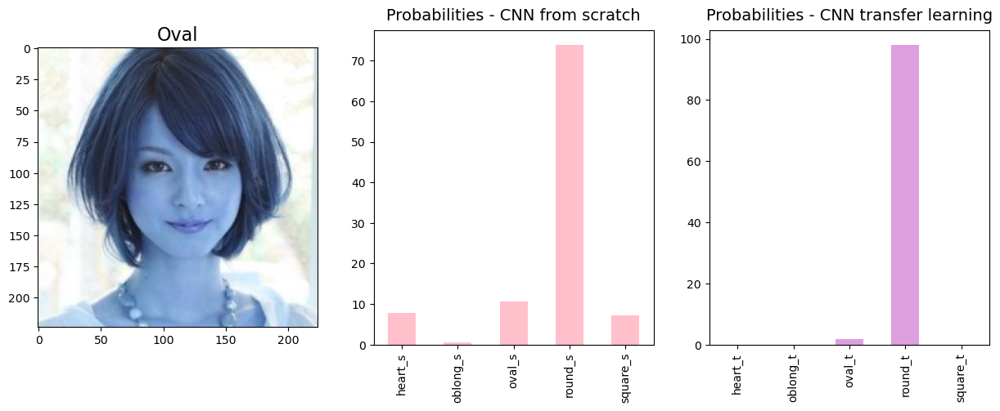

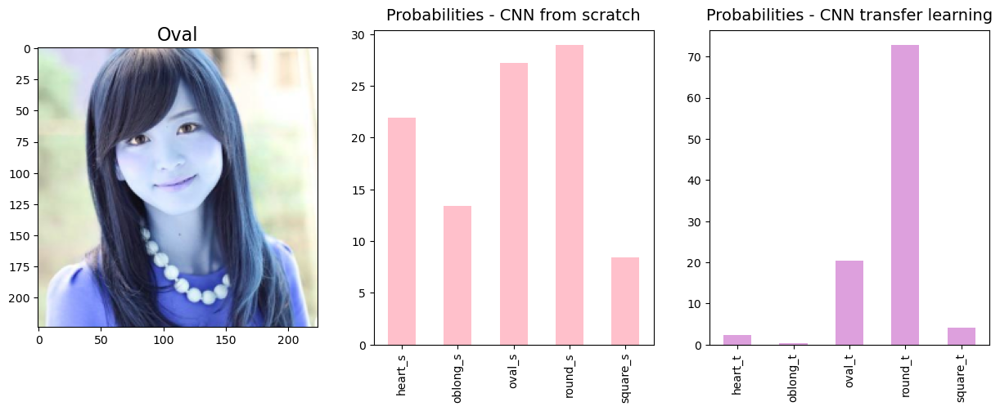

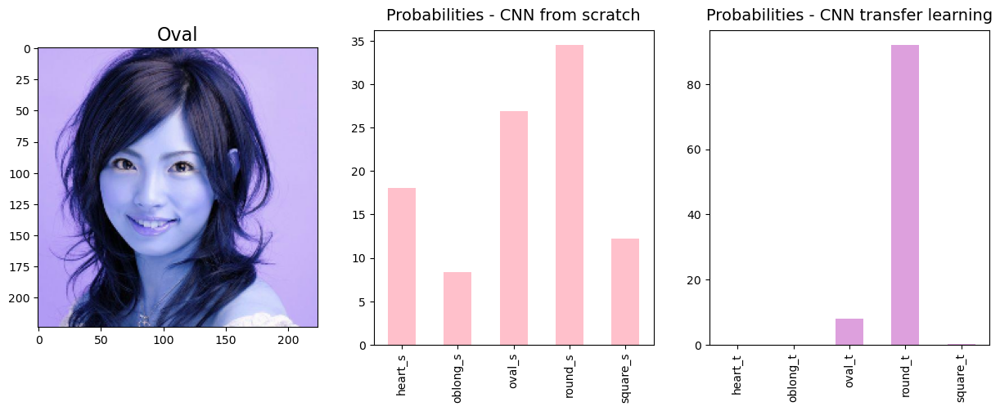

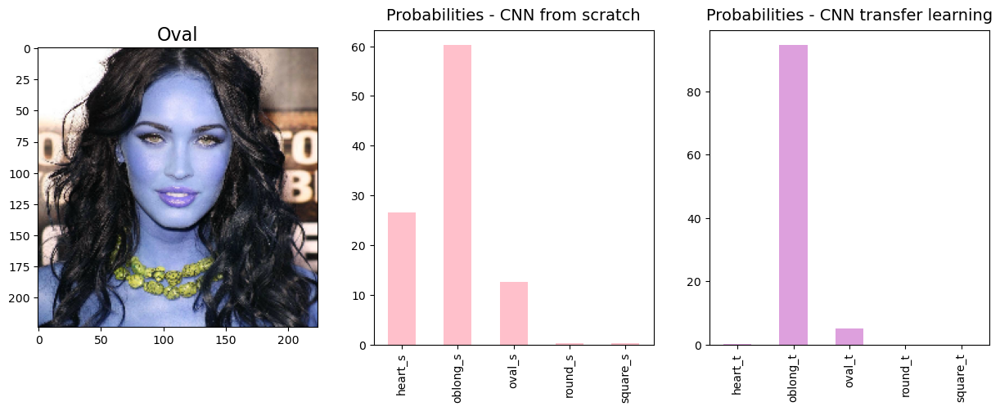

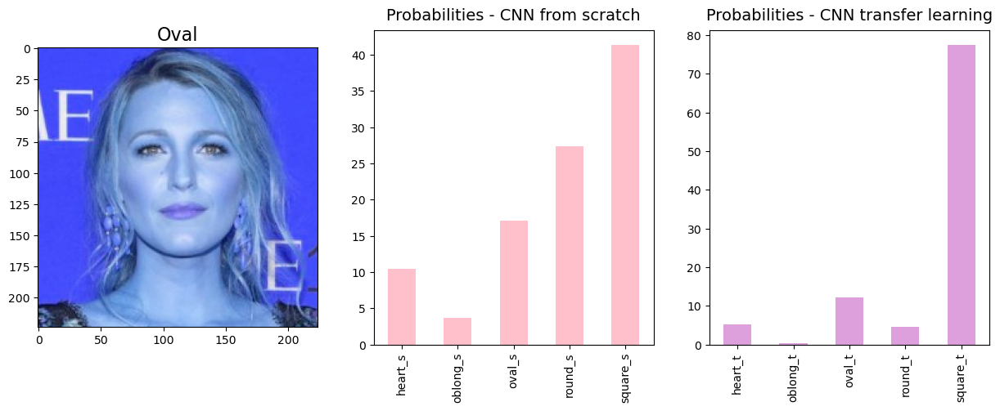

In [28]:
# identify and plot 20 images where both models misclassify, but incorrectly predicted different classes.

both_wrong_same_index = both_wrong_same[(both_wrong_same.actual == 'Oval')].head(30).index
plot_misclass_img_proba(both_wrong_same[(both_wrong_same.actual == 'Oval')].head(30), both_wrong_same_index)

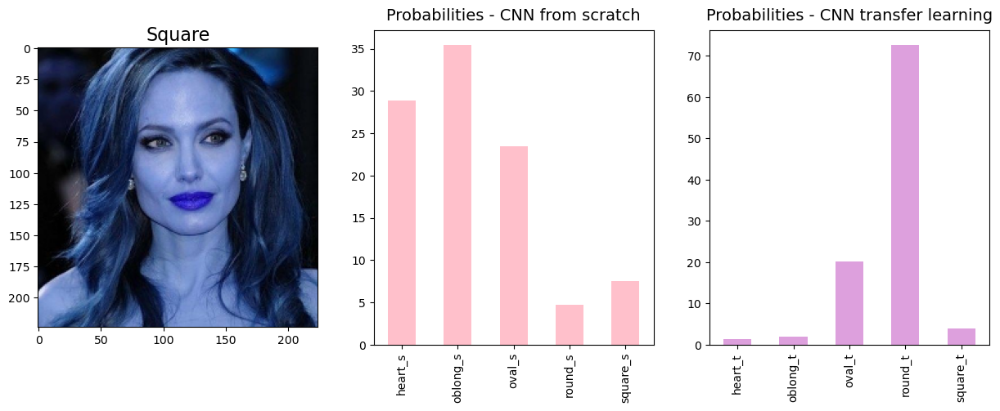

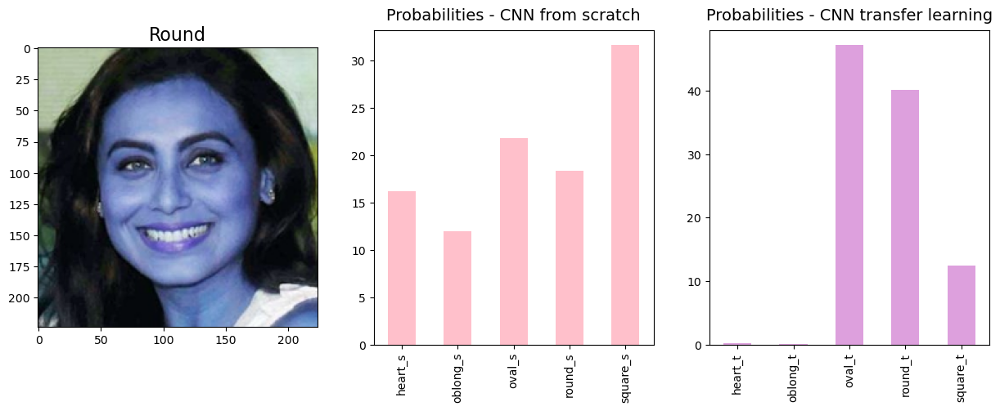

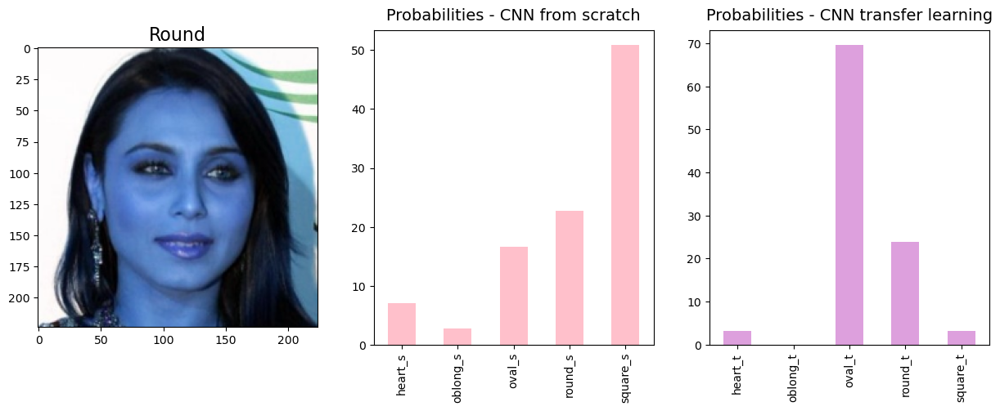

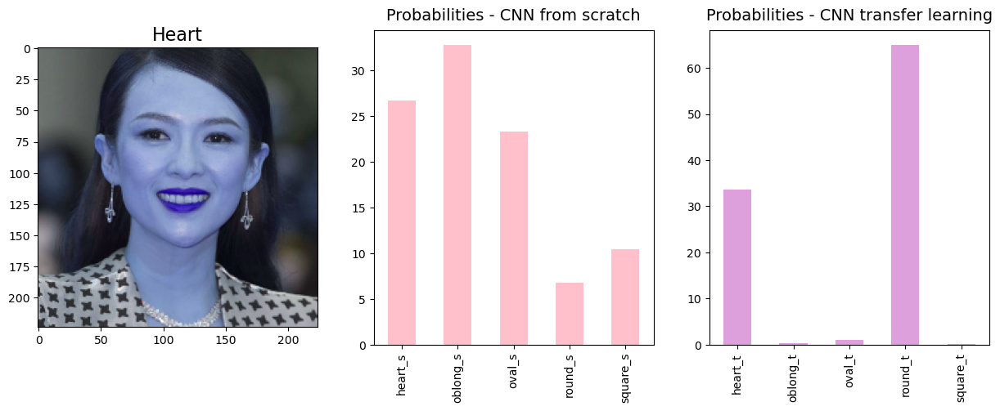

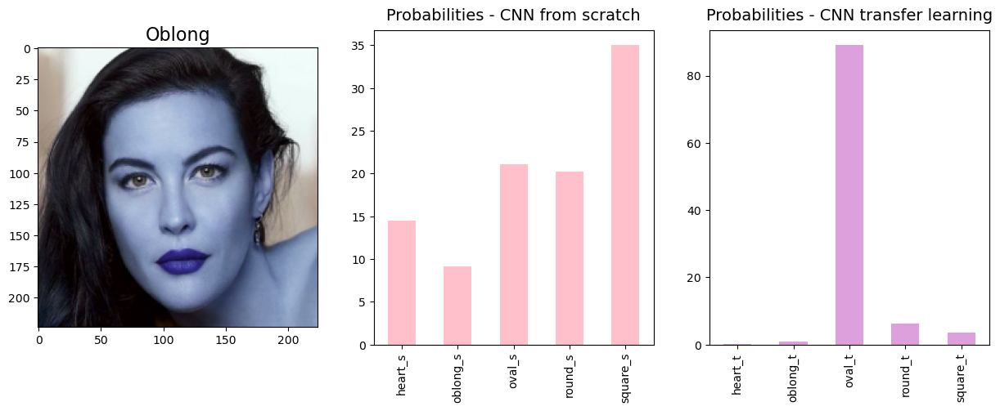

...

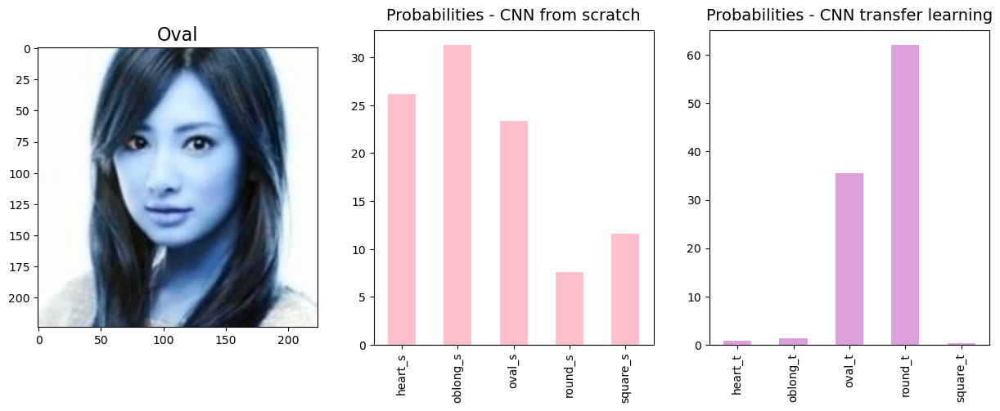

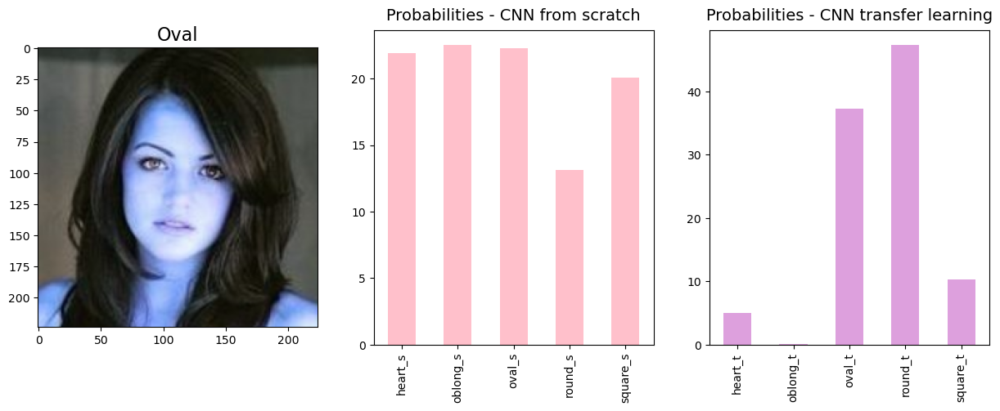

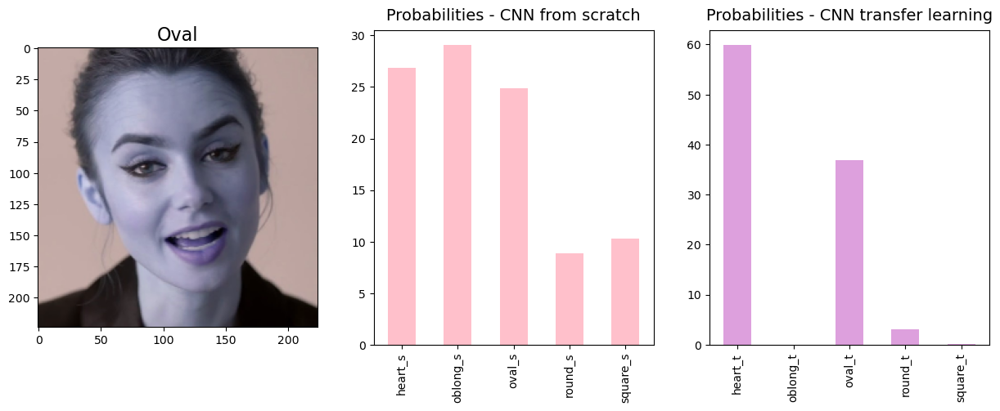

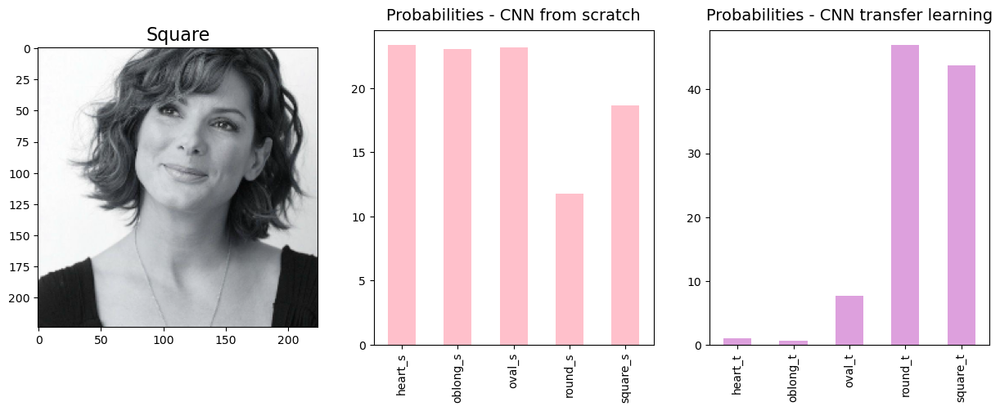

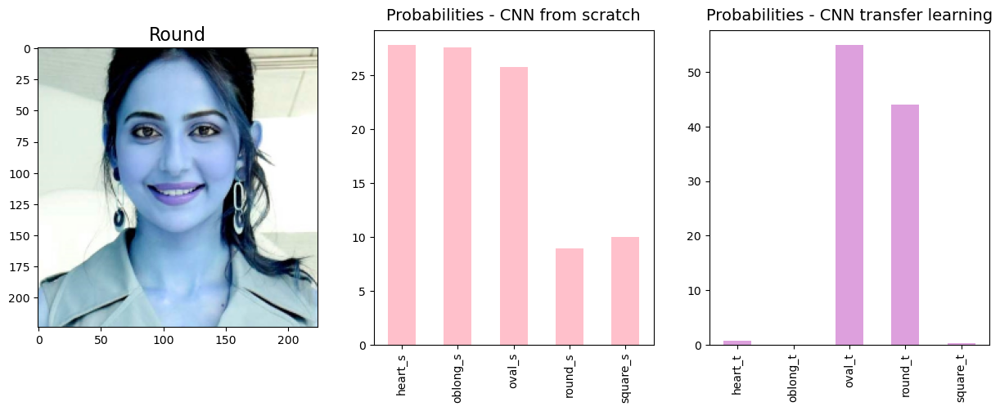

In [29]:
# identify and plot 20 images where both models misclassify, but incorrectly predicted different classes.

both_wrong_different_index = both_wrong_different.head(20).index
plot_misclass_img_proba(both_wrong_different.head(20), both_wrong_different_index)

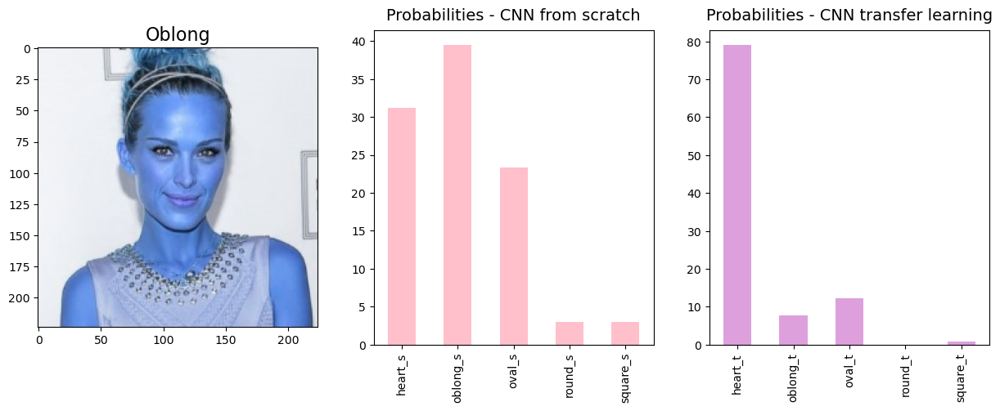

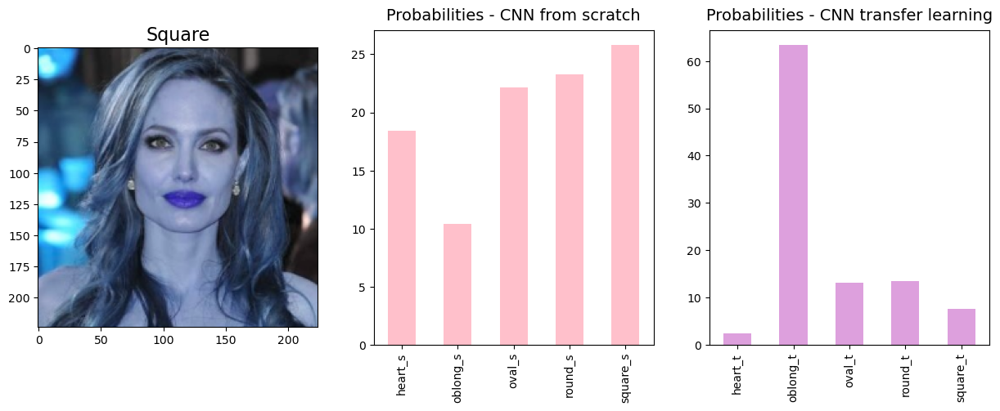

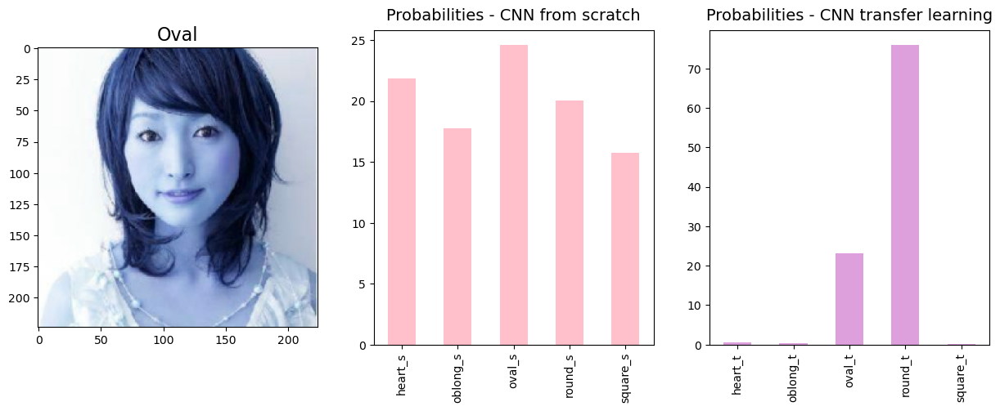

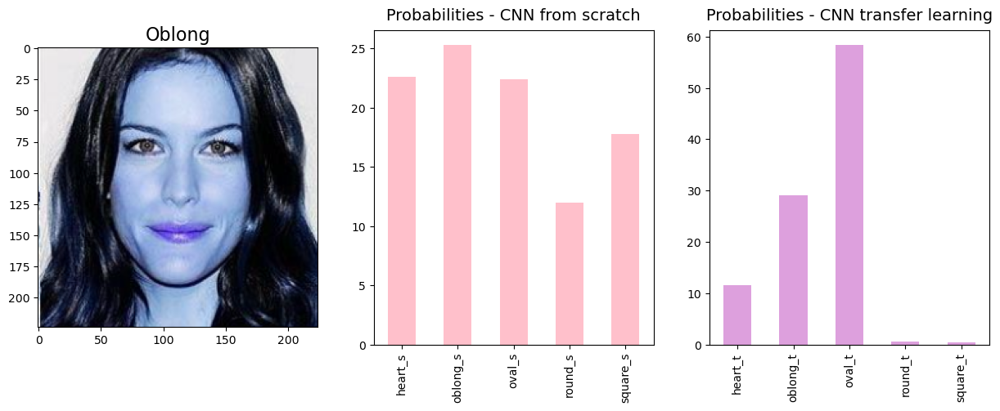

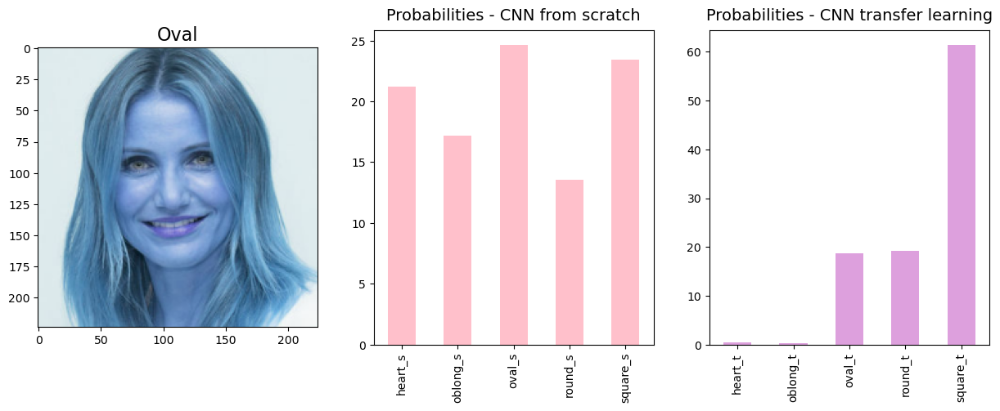

...

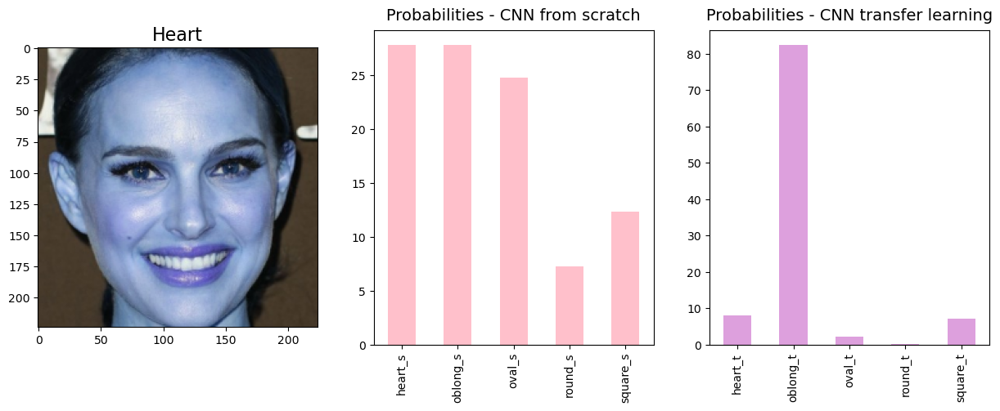

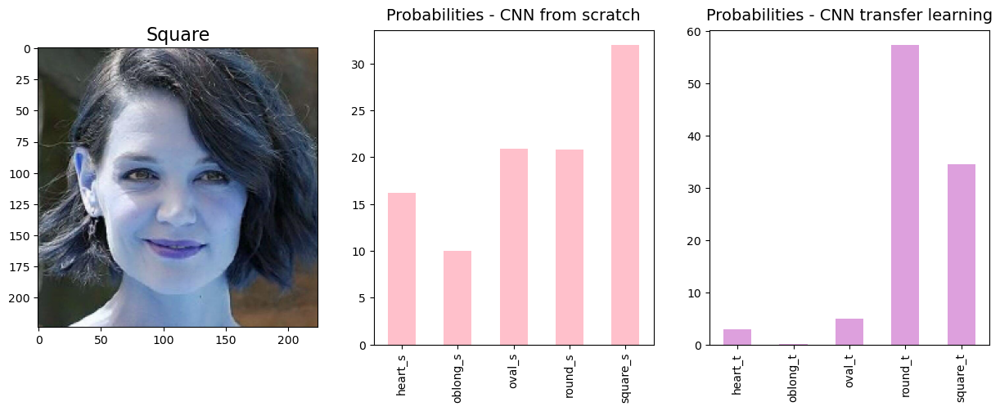

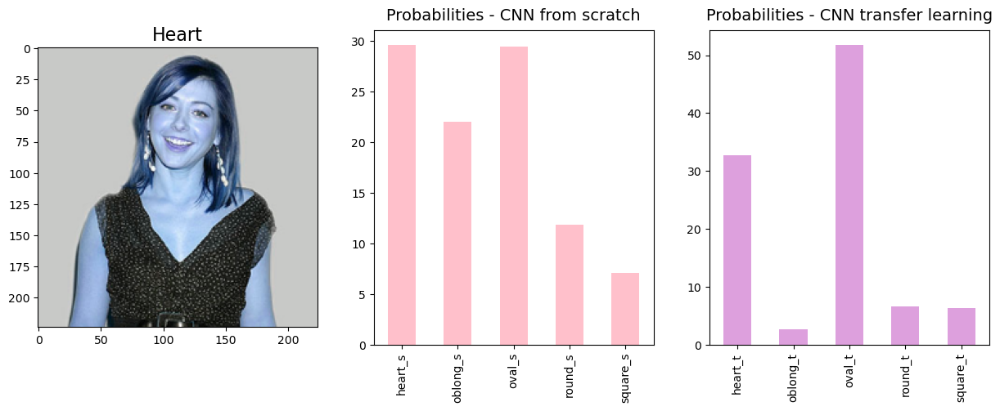

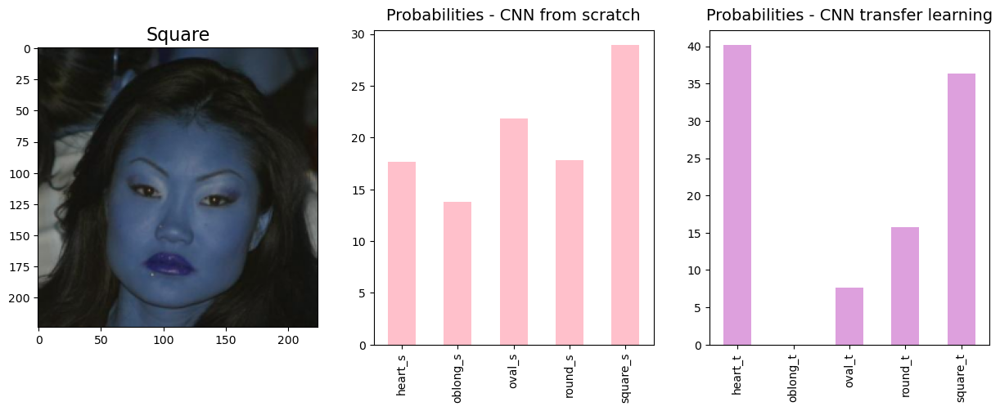

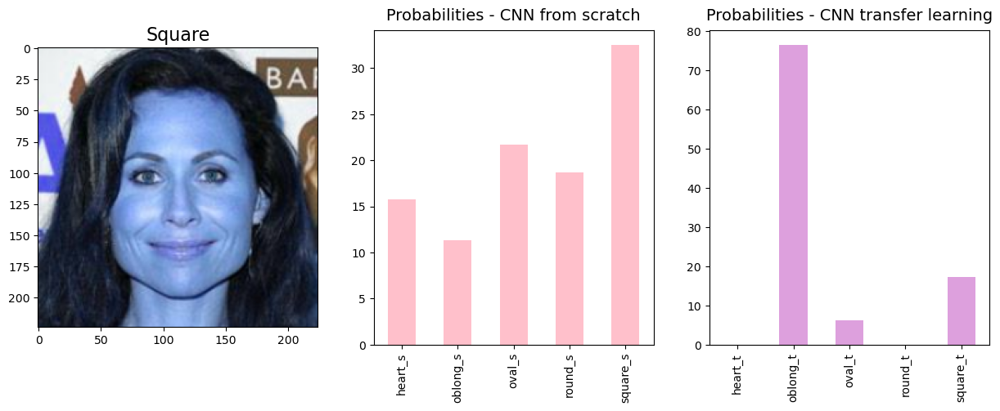

In [30]:
# identify and plot 20 images where Transfer Learning misclassifies, but Model from scratch correctly predicted.

t_misclass_index = t_misclass[(t_misclass.s_misclass == 0)].head(20).index
plot_misclass_img_proba(t_misclass[(t_misclass.s_misclass == 0)].head(20), t_misclass_index)

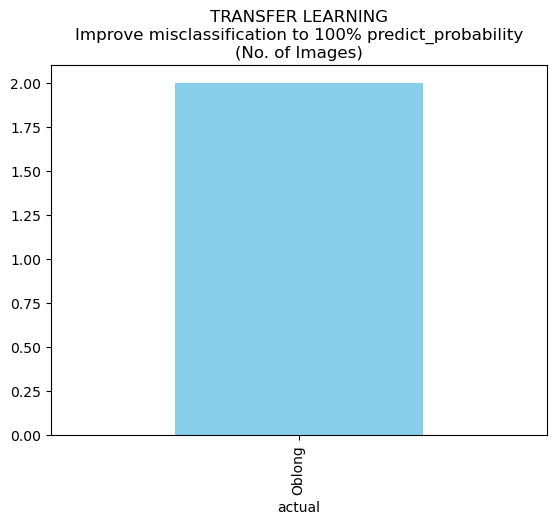

In [31]:
# filter where CNN from scratch misclassification, while Transfer Learning has 100% probability on the predicted class
mask_100 = ((s_misclass.heart_t == 100) | (s_misclass.oblong_t == 100) | (s_misclass.oval_t == 100) |
            (s_misclass.round_t == 100) | (s_misclass.square_t == 100))
s_misclass_t100 = s_misclass[(mask_100)]
s_misclass_t100.groupby('actual')['y_actual'].count().plot(kind='bar', color='skyblue')
plt.title('TRANSFER LEARNING\nImprove misclassification to 100% predict_probability\n(No. of Images)');
plt.savefig(f"transfer_100.png");

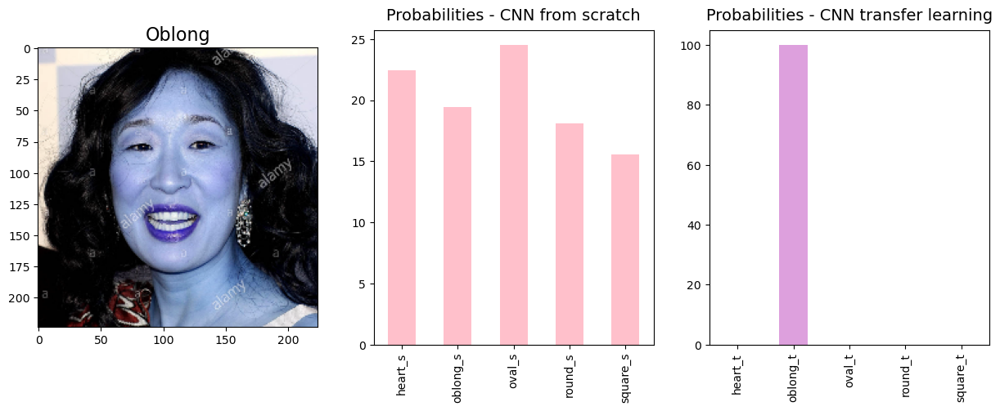

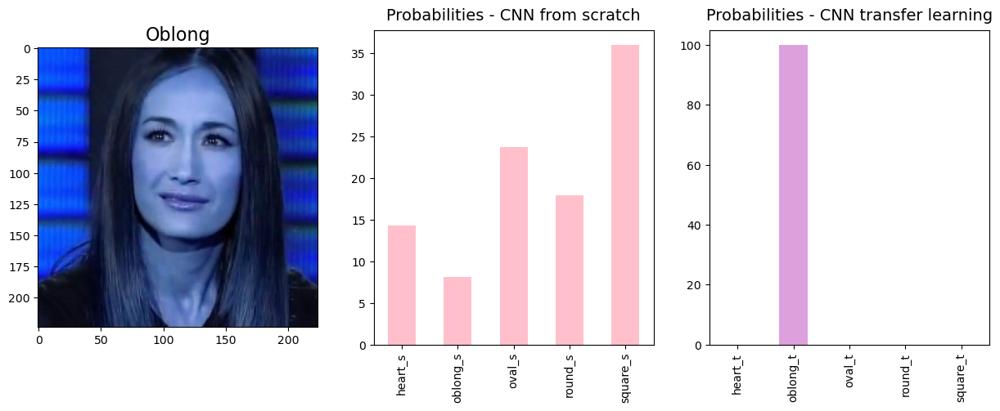

In [32]:
s_misclass_t100_index = s_misclass_t100.head(20).index
plot_misclass_img_proba(s_misclass_t100.head(20), s_misclass_t100_index)